In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats
import math
from scipy.stats import chi2_contingency


In [ ]:
diab_df=pd.read_csv('/content/drive/MyDrive/Capstone/diabetic_data.csv')

In [ ]:
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

# **Exploratory Data Analysis**

In [ ]:
def plot_feature_dist(df,col,title):
    fig = px.histogram(df, x=col, title=f'{title} Distribution')
    fig.update_xaxes(title=title)
    fig.update_yaxes(title='Count')
    fig.show()

In [ ]:
def readmitted_by_feature(metric):
    # Group the data by 'metric' and 'readmitted', and calculate the count for each combination
    grouped_data = diab_df.groupby([metric, 'readmitted']).size().unstack()

    # Calculate the percentage of readmitted patients for each category
    grouped_data['percent_readmitted'] = (grouped_data['<30'] + grouped_data['>30']) / grouped_data.sum(axis=1) * 100

    # Create a DataFrame for Plotly
    grouped_data_reset = grouped_data.reset_index()

    # Apply log transformation to the count values
    readmitted_categories = ['<30', '>30', 'NO']
    for category in readmitted_categories:
        grouped_data_reset[category] = np.log10(grouped_data_reset[category] + 1)  # Adding 1 to avoid log(0)

    # Create the bar plot using Plotly
    fig = px.bar(grouped_data_reset, x=metric, y=readmitted_categories, barmode='group',
                 labels={metric: metric, 'value': 'Log Count'},
                 color_discrete_sequence=px.colors.qualitative.Pastel)

    # Customize the plot layout
    fig.update_layout(title=f'Readmission Patient Count by {metric} (Log10 Scale)', xaxis_title=metric,
                      yaxis_title='Log10 Patient Count', legend_title_text='Readmission Category')

                      #xaxis={'categoryorder': 'total ascending'}

    # Display the plot
    fig.show()

    return grouped_data

In [ ]:
def prop_readmitted_by_feature(df,category,x_label):
    # Create the bar plot using Plotly Express
    fig = px.bar(df, x=category, y='percent_readmitted',
                 labels={'x': x_label, 'percent_readmitted': 'Percentage Readmitted'},
                 title=f'Percentage of Readmitted Patients by {x_label}')

    # Customize the x-axis labels
    fig.update_xaxes(categoryorder='total ascending')

    # Display the plot
    fig.show()



In [ ]:
# Function to create a labeled pie chart
def create_pie_chart(df, column_name, title):
    counts = df[column_name].value_counts()
    fig = px.pie(counts, names=counts.index, values=counts.values, labels='counts')

    # Customize the layout
    fig.update_layout(
        title=title,
        title_x=0.51,  # Adjust the title's x-position to be centered
        title_y=0.95,  # Adjust the title's y-position to be just above the pie chart
        title_font=dict(size=18),  # Adjust title font size
        legend=dict(
            x=0.77,  # Adjust the x-position of the legend
            y=0.9,  # Adjust the y-position of the legend
        ),
    )

    fig.show()

In [ ]:
# Create pie chart for 'race'
create_pie_chart(diab_df, 'race', 'Race Distribution')

In [ ]:
# Create pie chart for 'race'
create_pie_chart(diab_df, 'gender', 'Gender Distribution')

In [ ]:
plot_feature_dist(diab_df,col='age',title= 'Age')

In [ ]:
def readmitted_by_feature(metric):
    # Group the data by 'metric' and 'readmitted', and calculate the count for each combination
    grouped_data = diab_df.groupby([metric, 'readmitted']).size().unstack()

    # Calculate the percentage of readmitted patients for each category
    total_counts = grouped_data.sum(axis=1)
    for col in grouped_data.columns:
        grouped_data[col] = (grouped_data[col] / total_counts) * 100

    # Calculate the sum of percentages in '<30' and '>30' categories and sort by it
    grouped_data['sum_percentages'] = grouped_data['<30'] + grouped_data['>30']
    grouped_data = grouped_data.sort_values(by='sum_percentages', ascending=True)
    grouped_data.drop(columns='sum_percentages', inplace=True)

    # Create a DataFrame for Plotly
    grouped_data_reset = grouped_data.reset_index()

    # Create the bar plot using Plotly
    fig = px.bar(grouped_data_reset, x=metric, y=['<30', '>30', 'NO'], barmode='relative',
                 labels={metric: metric, 'value': 'Percentage'},
                 color_discrete_sequence=px.colors.qualitative.Pastel,
                 title=f'Readmission Patient Percentage by {metric}')

    # Customize the plot layout
    fig.update_layout(xaxis_title=metric, yaxis_title='Percentage', legend_title_text='Readmission Category')

    # Display the plot
    fig.show()

    return grouped_data

In [ ]:
def time_in_hosp_by_feature(data, x_col, y_col='time_in_hospital'):
    """
    Create a set of boxplots for the 'y_col' variable for each category in the 'x_col' column.

    Parameters:
    data (DataFrame): The DataFrame containing the data.
    x_col (str): The name of the categorical column.
    y_col (str, optional): The name of the continuous variable for which boxplots are created. Default is 'time_in_hospital'.
    """
    fig = px.box(data_frame=data, x=x_col, y=y_col, title=f'Distribution of {y_col} by {x_col}')
    fig.update_xaxes(tickangle=45)
    fig.show()

In [ ]:
race_readm_df=readmitted_by_feature(metric='race')

In [ ]:
sex_readm_df= readmitted_by_feature(metric='gender')

In [ ]:
age_readm_df= readmitted_by_feature(metric='age')

In [ ]:
time_in_hosp_by_feature(diab_df, x_col='race', y_col='time_in_hospital')

In [ ]:
time_in_hosp_by_feature(diab_df, x_col='gender', y_col='time_in_hospital')

In [ ]:
time_in_hosp_by_feature(diab_df, x_col='age', y_col='time_in_hospital')

In [ ]:
def plot_histogram(df, column_name):
    # Set the seaborn style and color palette
    sns.set_style("whitegrid")
    sns.set_palette("pastel")

    # Create a histogram of the specified column
    plt.figure(figsize=(10, 6))
    n, bins, _ = plt.hist(df[column_name], bins=30, alpha=0.7, edgecolor='black')

    # Calculate mean, median, and 95% confidence interval
    mean_value, median_value = np.mean(df[column_name]), np.median(df[column_name])
    conf_interval = stats.norm.interval(0.95, loc=mean_value, scale=df[column_name].std())

    # Add vertical lines with labels
    plt.axvline(x=mean_value, color='black', linestyle='--', linewidth=2, label='Mean')
    plt.axvline(x=median_value, color='green', linestyle='--', linewidth=2, label='Median')
    plt.axvline(x=conf_interval[0], color='red', linestyle='--', linewidth=2, label='95% CI (Lower Bound)')
    plt.axvline(x=conf_interval[1], color='red', linestyle='--', linewidth=2, label='95% CI (Upper Bound)')

    # Add legend
    plt.legend()

    # Customize labels and title
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {column_name}')

    # Show the histogram
    plt.show()






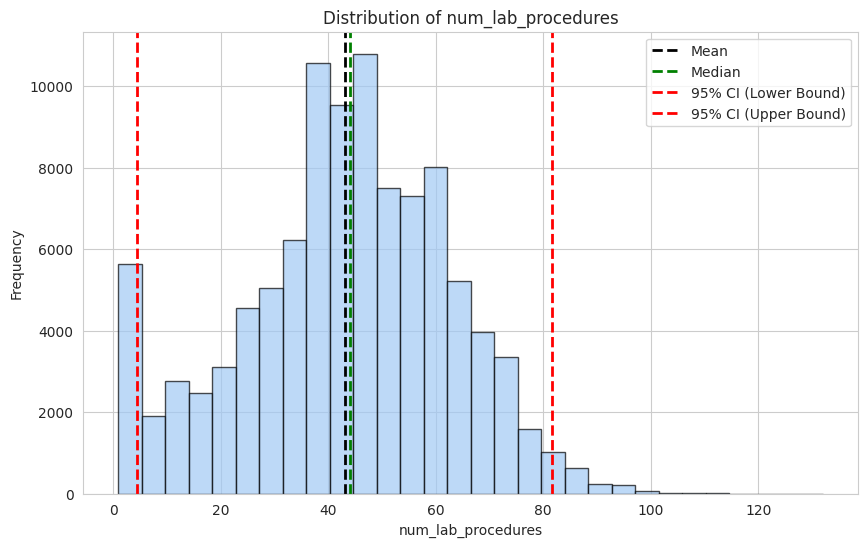

In [ ]:
plot_histogram(diab_df, 'num_lab_procedures')

In [ ]:
diab_df.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

In [ ]:
import plotly.subplots as sp
import plotly.graph_objects as go

# Define the columns of interest
columns_of_interest = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
                        'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']
names = ['Time in Hospital (Days)', 'Lab Procedures', 'Procedures', 'Medications',
         'Outpatient Visits', 'Emergency Room Visits', 'Inpatient Visits', 'Diagnoses']

# Create subplots
fig = sp.make_subplots(rows=2, cols=4, subplot_titles=names, vertical_spacing = 0.1)

# Create boxplots for each column
for i, column in enumerate(columns_of_interest):
    row = i // 4 + 1
    col = i % 4 + 1

    trace = go.Box(y=diab_df[column], name=names[i], boxmean=True, orientation = 'v')
    fig.add_trace(trace, row=row, col=col)

    # Remove y-axis tick labels
    fig.update_xaxes(showticklabels=False, row=row, col=col)

# Update layout
fig.update_layout(
    title="Distributions of Numerical Variables",
    showlegend=False
)

# Show the plot
fig.show()

In [ ]:
fig = px.box(diab_df, x='time_in_hospital', color='readmitted', y='diabetesMed',
             category_orders = {'readmitted':['NO', '<30', '>30']})
fig.update_layout(
    title="Time Spent in the Hospital for Patients with Different Readmittance and Diabetes Medication Intake")
fig.show()

In [ ]:
fig = px.box(diab_df, x='time_in_hospital', y='diabetesMed')
fig.show()

In [ ]:
fig = px.histogram(diab_df, x='time_in_hospital', color='diabetesMed')
fig.update_layout(
    title="Distribution of the Time Spent in the Hospital for Patients with Different Diabetes Medication Intake",
    yaxis_title='Number of Patients')
fig.show()

In [ ]:
fig = px.histogram(diab_df, x='time_in_hospital', color='readmitted',
             category_orders = {'readmitted':['NO', '<30', '>30']})
fig.update_layout(
    title="Distribution of the Time Spent in the Hospital for Patients with Different Readmittance",
    yaxis_title='Number of Patients')
fig.show()

In [ ]:
# Create subplots
fig = sp.make_subplots(rows=4, cols=2, subplot_titles=columns_of_interest)

# Create vertical boxplots for each column
for i, column in enumerate(columns_of_interest, start=1):
    trace = go.Box(y=diab_df[column], name=column, boxmean=True, orientation='v')
    fig.add_trace(trace, row=i, col=1)

# Update layout
fig.update_layout(
    title="Vertical Boxplots for Selected Columns",
    showlegend=False,
    yaxis=dict(title="Values")
)

# Show the plot
fig.show()

Exception: ignored

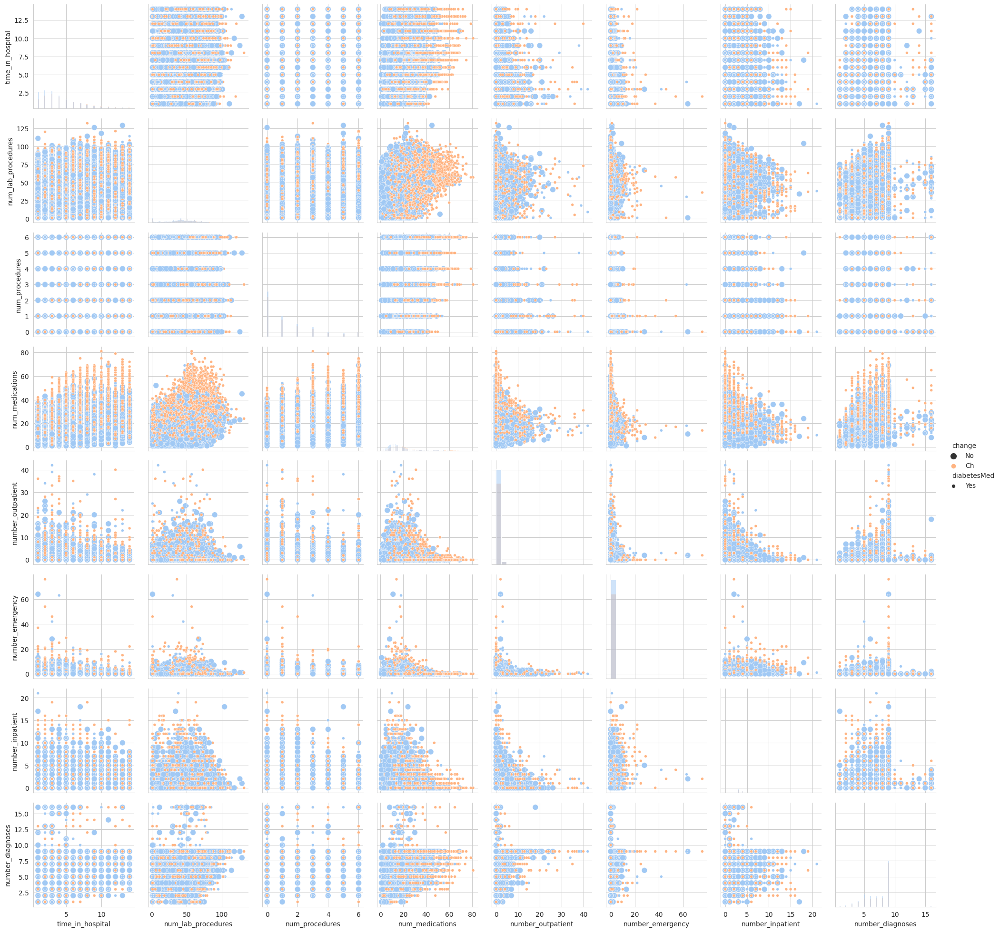

In [ ]:
g = sns.PairGrid(diab_df, hue="change",vars=['time_in_hospital','num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient','number_diagnoses'])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot, size=diab_df["diabetesMed"])
g.add_legend(title="", adjust_subtitles=True)

In [ ]:
plot_histogram(diab_df, 'num_procedures')

In [ ]:
plot_histogram(diab_df, 'num_medications')

In [ ]:
plot_histogram(diab_df, 'num_procedures')

# **Data Cleaning**

## **Preliminary Feature Cleaning**

In [ ]:
diab_df=pd.read_csv('/content/drive/MyDrive/Capstone/diabetic_data.csv')

In [ ]:
diab_df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
#Since missing values are represented as ?, change them to NaN
diab_df.replace('?', np.nan, inplace=True)

In [ ]:
# Drop irrelevant columns from the DataFrame
columns_to_drop = ['encounter_id', 'patient_nbr', 'payer_code']
diab_df = diab_df.drop(columns_to_drop, axis=1)

In [ ]:
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 47 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      99493 non-null   object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   weight                    3197 non-null    object
 4   admission_type_id         101766 non-null  int64 
 5   discharge_disposition_id  101766 non-null  int64 
 6   admission_source_id       101766 non-null  int64 
 7   time_in_hospital          101766 non-null  int64 
 8   medical_specialty         51817 non-null   object
 9   num_lab_procedures        101766 non-null  int64 
 10  num_procedures            101766 non-null  int64 
 11  num_medications           101766 non-null  int64 
 12  number_outpatient         101766 non-null  int64 
 13  number_emergency          101766 non-null  int64 
 14  numb

In [ ]:
#Drop 'weight' column due to largely missing values
diab_df = diab_df.drop(['weight','medical_specialty'], axis=1)

## **Missing Values**

In [ ]:
diab_df.isnull().sum()

race                        2273
gender                         0
age                            0
admission_type_id              0
discharge_disposition_id       0
admission_source_id            0
time_in_hospital               0
num_lab_procedures             0
num_procedures                 0
num_medications                0
number_outpatient              0
number_emergency               0
number_inpatient               0
diag_1                        21
diag_2                       358
diag_3                      1423
number_diagnoses               0
max_glu_serum                  0
A1Cresult                      0
metformin                      0
repaglinide                    0
nateglinide                    0
chlorpropamide                 0
glimepiride                    0
acetohexamide                  0
glipizide                      0
glyburide                      0
tolbutamide                    0
pioglitazone                   0
rosiglitazone                  0
acarbose  

In [ ]:
#impute the missing values in the race column with its mode
diab_df['race'].fillna(diab_df['race'].mode()[0], inplace=True)

In [ ]:
cols_to_impute = ['diag_1', 'diag_2', 'diag_3']
for col in cols_to_impute:
    diab_df[col].fillna('Unknown', inplace=True)

In [ ]:
diab_df.isnull().sum()

race                        0
gender                      0
age                         0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazone                0
tolazamide

## **Duplicates**

In [ ]:
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101766 non-null  object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   admission_type_id         101766 non-null  int64 
 4   discharge_disposition_id  101766 non-null  int64 
 5   admission_source_id       101766 non-null  int64 
 6   time_in_hospital          101766 non-null  int64 
 7   num_lab_procedures        101766 non-null  int64 
 8   num_procedures            101766 non-null  int64 
 9   num_medications           101766 non-null  int64 
 10  number_outpatient         101766 non-null  int64 
 11  number_emergency          101766 non-null  int64 
 12  number_inpatient          101766 non-null  int64 
 13  diag_1                    101766 non-null  object
 14  diag

In [ ]:
# Check for and remove duplicate rows
diab_df.drop_duplicates(inplace=True)

In [ ]:
#no duplicates where found
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101766 entries, 0 to 101765
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101766 non-null  object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   admission_type_id         101766 non-null  int64 
 4   discharge_disposition_id  101766 non-null  int64 
 5   admission_source_id       101766 non-null  int64 
 6   time_in_hospital          101766 non-null  int64 
 7   num_lab_procedures        101766 non-null  int64 
 8   num_procedures            101766 non-null  int64 
 9   num_medications           101766 non-null  int64 
 10  number_outpatient         101766 non-null  int64 
 11  number_emergency          101766 non-null  int64 
 12  number_inpatient          101766 non-null  int64 
 13  diag_1                    101766 non-null  object
 14  diag

## **Outliers**

In [ ]:
# Convert specified columns to 'object' type
diab_df['admission_type_id'] = diab_df['admission_type_id'].astype('object')
diab_df['discharge_disposition_id'] = diab_df['discharge_disposition_id'].astype('object')
diab_df['admission_source_id'] = diab_df['admission_source_id'].astype('object')

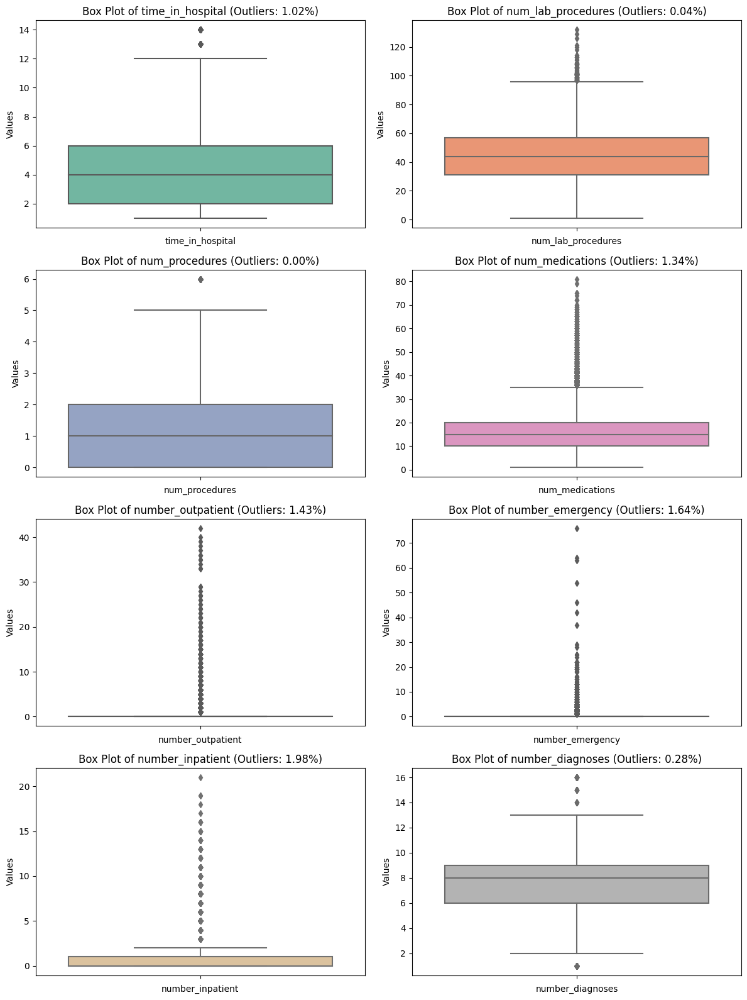

In [ ]:
# Select numerical columns based on data type
numerical_columns = diab_df.select_dtypes(include=['number']).columns

# Specify the threshold for Z-score
threshold = 3

# Calculate the number of rows and columns for the grid
num_plots = len(numerical_columns)
num_rows = math.ceil(num_plots / 2)
num_cols = 2

# Create a figure and subplots for the grid
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 4 * num_rows))
fig.subplots_adjust(hspace=0.5)  # Adjust vertical spacing

# Flatten the axes for easier iteration
axes = axes.flatten()

# Define distinct colors for box plots
colors = sns.color_palette('Set2', num_plots)

# Loop through numerical columns
for i, column in enumerate(numerical_columns):
    # Calculate Z-scores for the current column
    z_scores = stats.zscore(diab_df[column])

    # Identify outliers based on Z-scores
    outliers = (z_scores > threshold) | (z_scores < -threshold)

    # Compute the percentage of outliers
    percentage_outliers = (sum(outliers) / len(diab_df)) * 100

    # Create a vertical box plot for the current column with a unique color
    sns.boxplot(y=diab_df[column], ax=axes[i], color=colors[i])

    # Customize the subplot
    axes[i].set_title(f'Box Plot of {column} (Outliers: {percentage_outliers:.2f}%)')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Values')


# Show the plots
plt.tight_layout()

# Display the plots
plt.show()


In [ ]:
# Specify the threshold for Z-score
threshold = 3

# Calculate Z-scores for all numerical columns
z_scores = stats.zscore(diab_df.select_dtypes(include=['number']))

# Identify outliers based on Z-scores
outliers = (z_scores > threshold).any(axis=1)

# Create the 'outliers' column in your DataFrame
diab_df['outliers'] = outliers

In [ ]:
diab_df['outliers'].value_counts()

False    94787
True      6979
Name: outliers, dtype: int64

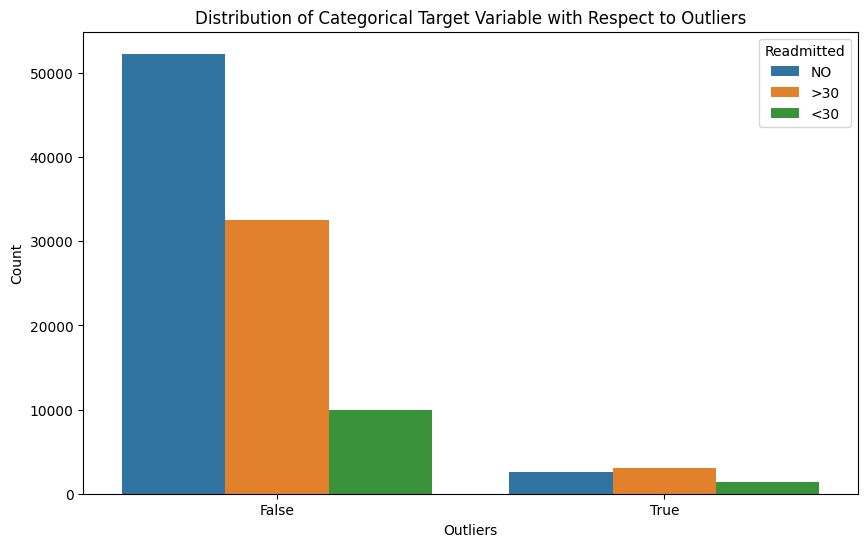

In [ ]:
# Create a bar plot to visualize the distribution of 'readmitted' with respect to outliers
plt.figure(figsize=(10, 6))
sns.countplot(x='outliers', hue='readmitted', data=diab_df)

# Customize the plot
plt.title('Distribution of Categorical Target Variable with Respect to Outliers')
plt.xlabel('Outliers')
plt.ylabel('Count')
plt.legend(title='Readmitted', loc='upper right')

# Show the plot
plt.show()

# **Feature Engineering**

In [ ]:
diab_df['outpatient'] = np.where(diab_df['number_outpatient']==0,0,1)
diab_df['emergency'] = np.where(diab_df['number_emergency']==0,0,1)

In [ ]:
diab_df = diab_df.drop('number_outpatient',axis=1)
diab_df = diab_df.drop('number_emergency',axis=1)

In [ ]:
diab_df['number_inpatient'].value_counts(normalize = True)

0     0.664564
1     0.191822
2     0.074347
3     0.033518
4     0.015939
5     0.007979
6     0.004717
7     0.002633
8     0.001484
9     0.001091
10    0.000599
11    0.000481
12    0.000334
13    0.000197
14    0.000098
15    0.000088
16    0.000059
19    0.000020
17    0.000010
21    0.000010
18    0.000010
Name: number_inpatient, dtype: float64

In [ ]:
diab_df['diabetesMed'].value_counts(normalize = True)

Yes    0.770031
No     0.229969
Name: diabetesMed, dtype: float64

# **Feature Selection**

## **Correlation Analysis**


In [ ]:
correlation_matrix = diab_df.corr()

<ipython-input-61-dea4c9527953>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = diab_df.corr()


In [ ]:
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101766 entries, 0 to 101765
Data columns (total 46 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101766 non-null  object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   admission_type_id         101766 non-null  object
 4   discharge_disposition_id  101766 non-null  object
 5   admission_source_id       101766 non-null  object
 6   time_in_hospital          101766 non-null  int64 
 7   num_lab_procedures        101766 non-null  int64 
 8   num_procedures            101766 non-null  int64 
 9   num_medications           101766 non-null  int64 
 10  number_inpatient          101766 non-null  int64 
 11  diag_1                    101766 non-null  object
 12  diag_2                    101766 non-null  object
 13  diag_3                    101766 non-null  object
 14  numb

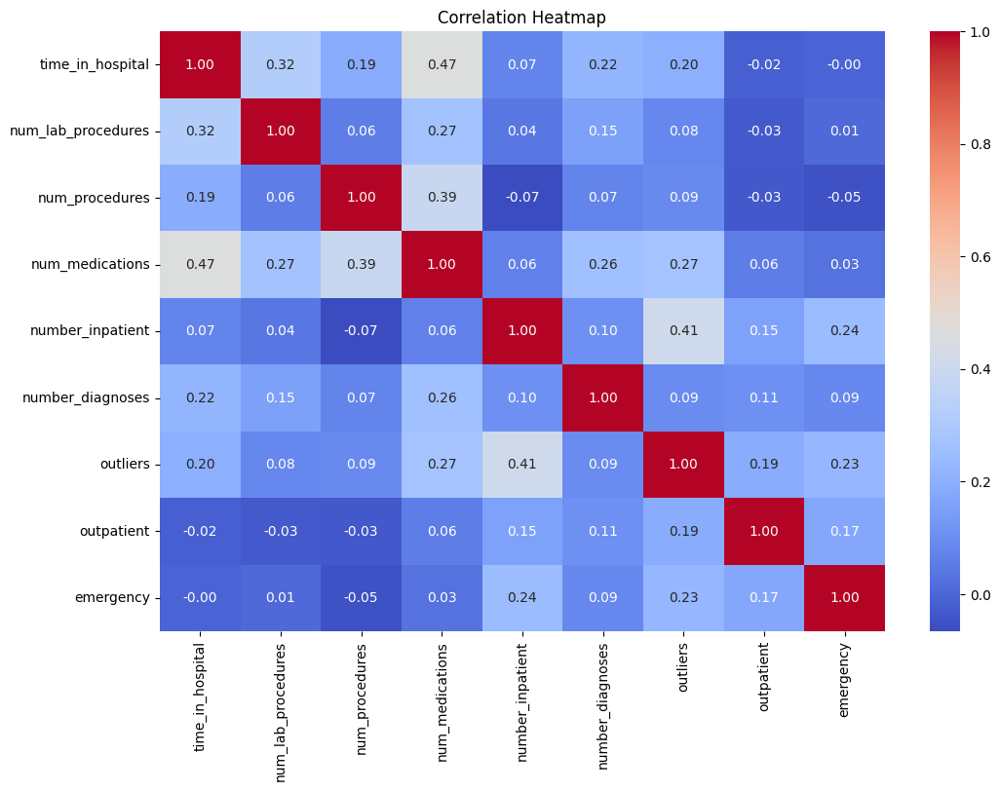

In [ ]:
# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

## **Chi2 Analysis**

In [ ]:
# Identify categorical columns
categorical_columns = diab_df.select_dtypes(include=['object']).columns
categorical_columns.drop('readmitted')

# Create an empty DataFrame to store chi-squared test results
chi_squared_results = pd.DataFrame(columns=['Categorical Column', 'Chi-squared Statistic', 'P-Value'])

# Create a list to store significant categorical columns
significant_categorical_columns = []

# Iterate through each categorical column
for column in categorical_columns:
    # Create a contingency table
    contingency_table = pd.crosstab(diab_df[column], diab_df['readmitted'])

    # Perform the chi-squared test
    chi2, p, _, _ = chi2_contingency(contingency_table)

    # Append the results to the DataFrame
    chi_squared_results = chi_squared_results.append({'Categorical Column': column,
                                                      'Chi-squared Statistic': chi2,
                                                      'P-Value': p}, ignore_index=True)

    # Check if the p-value is below a significance threshold (e.g., 0.05)
    if p < 0.05:
        significant_categorical_columns.append(column)


In [ ]:
chi_squared_results

,Categorical Column,Chi-squared Statistic,P-Value
0,race,81.935228,1.992203e-14
1,gender,37.461170,1.447272e-07
2,age,313.171753,9.348415e-56
3,admission_type_id,415.760978,6.037493e-80
4,discharge_disposition_id,3587.291304,0.000000e+00
5,admission_source_id,1150.971841,2.317985e-221
6,diag_1,4970.815982,0.000000e+00
7,diag_2,4014.559344,5.143196e-229
8,diag_3,3938.799576,5.906473e-202
9,max_glu_serum,51.922098,1.933304e-09


In [ ]:
cols_to_drop_chi = chi_squared_results[(chi_squared_results['P-Value']>=0.05) | (chi_squared_results['Chi-squared Statistic']<=25)]['Categorical Column'].tolist()
cols_to_drop_chi

['nateglinide',
 'chlorpropamide',
 'glimepiride',
 'acetohexamide',
 'glyburide',
 'tolbutamide',
 'miglitol',
 'troglitazone',
 'tolazamide',
 'examide',
 'citoglipton',
 'glyburide-metformin',
 'glipizide-metformin',
 'glimepiride-pioglitazone',
 'metformin-rosiglitazone',
 'metformin-pioglitazone']

In [ ]:
from sklearn.feature_selection import mutual_info_classif


# Separate the target variable from the features
X = diab_df.drop(columns=['readmitted'])  # Features
y = diab_df['readmitted']  # Target variable

# Identify categorical columns by excluding numeric columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Perform one-hot encoding for all categorical columns
X_encoded = pd.get_dummies(X, columns=categorical_columns)

# Calculate mutual information between features and the target variable
mutual_info = mutual_info_classif(X_encoded, y)

# Create a DataFrame to store the results
mutual_info_df = pd.DataFrame({'Feature': X_encoded.columns, 'Mutual_Info': mutual_info})

# Sort the DataFrame by mutual information values in descending order
mutual_info_df = mutual_info_df.sort_values(by='Mutual_Info', ascending=False)

# Now, 'mutual_info_df' contains the mutual information values for each feature
print(mutual_info_df)

<ipython-input-81-90787159e3ee>:12: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  X_encoded = pd.get_dummies(X, columns=categorical_columns)
<ipython-input-81-90787159e3ee>:12: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  X_encoded = pd.get_dummies(X, columns=categorical_columns)
<ipython-input-81-90787159e3ee>:12: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  X_encoded = pd.get_dummies(X, columns=categorical_columns)


                        Feature  Mutual_Info
4              number_inpatient     0.029619
5              number_diagnoses     0.014261
2347             repaglinide_No     0.013545
2390            troglitazone_No     0.013224
2411  metformin-pioglitazone_No     0.012604
...                         ...          ...
829                  diag_2_182     0.000000
830                  diag_2_183     0.000000
831                  diag_2_185     0.000000
1564                 diag_3_152     0.000000
1208                 diag_2_619     0.000000

[2417 rows x 2 columns]


In [ ]:
mutual_info_df

,Feature,Mutual_Info
4,number_inpatient,0.029619
5,number_diagnoses,0.014261
2347,repaglinide_No,0.013545
2390,troglitazone_No,0.013224
2411,metformin-pioglitazone_No,0.012604
...,...,...
829,diag_2_182,0.000000
830,diag_2_183,0.000000
831,diag_2_185,0.000000
1564,diag_3_152,0.000000
